# 0. Importing Necessary Packages

In [1]:
# Printing the versions of packages
from importlib_metadata import version
from astropy.visualization import astropy_mpl_style
import matplotlib.pyplot as plt
plt.style.use(astropy_mpl_style)
for pkg in ['numpy', 'matplotlib', 'astropy', 'pandas']:
    print(pkg+": ver "+version(pkg))

numpy: ver 1.20.3
matplotlib: ver 3.5.0
astropy: ver 4.3.1
pandas: ver 1.3.5


In [2]:
# matplotlib backend
%matplotlib notebook

# importing necessary modules
import numpy as np
import glob, os
from matplotlib import pyplot as plt
from astropy.io import fits
import pandas as pd

# 1. Writing Input Files

### 1) Image list

In [3]:
dir_img = "Images/"
band = ["F435W","F606W", "F814W"]
imglist = sorted(glob.glob(dir_img+"*.fits"))
imglist

['Images/F435W.fits', 'Images/F606W.fits', 'Images/F814W.fits']

### 2) Configuration file

In [4]:
config_name = "config.txt"
os.system("source-extractor -dd > "+config_name)

0

### 3) Output parameter file

In [5]:
param_name = "output.param"
f = open(param_name, "w")
f.write("X_IMAGE\n")    # Object position along x [pixel]
f.write("Y_IMAGE\n")    # Object position along y [pixel]
f.write("X_WORLD\n")    # Object position along x [pixel]
f.write("Y_WORLD\n")    # Object position along y [pixel]
f.write("NUMBER\n")    # Object number
f.write("MAG_AUTO\n")    # Kron-like elliptical aperture magnitude [mag]
f.write("MAGERR_AUTO\n")    # RMS error for MAG_AUTO    [mag]
f.write("KRON_RADIUS\n")    # Kron apertures in units of A or B
f.write("BACKGROUND\n")    # Background at centroid position
f.write("ALPHA_J2000\n")    # Right ascension of object center (J2000)
f.write("DELTA_J2000\n")    # Declination of object center (J2000)
f.write("A_IMAGE\n")    # Along major axis
f.write("B_IMAGE\n")    # Along minor axis
f.write("THETA_IMAGE\n")    # Position angle
f.write("MU_MAX\n")    # Peak surface brightness above background
f.write("FLAGS\n")    # Extraction flags
f.write("FWHM_IMAGE\n")    # FWHM assuming a gaussian core
f.write("FLUX_RADIUS\n")    # Half-light radii
f.write("CLASS_STAR\n")    # Star/Galaxy classifier output
f.write("ELLIPTICITY\n")    # Ellipticity
f.close()

### 4) Determining input parameters

In [6]:
h435 = fits.getheader(imglist[0])
h606 = fits.getheader(imglist[1])
h814 = fits.getheader(imglist[2])

In [7]:
# band = ["F606W", "F814W"]
cat_name = ["435.cat","606.cat", "814.cat"]
detect_minarea = 5  # DETECT_MINAREA = 5 (default)
detect_thresh = 3 # DETECT_THRESH = 1.5 (default)
deblend_mincont = 0.08  # DEBLEND_MINCONT = 0.005(default) -> 0.05
saturated = 100.0  # SATUR_LEVEL = 100.0 (depending on the image!)
mag0 = [-2.5*np.log10(h435['PHOTFLAM'])-5.0*np.log10(h435['PHOTPLAM'])-2.408,
        -2.5*np.log10(h606['PHOTFLAM'])-5.0*np.log10(h606['PHOTPLAM'])-2.408,
        -2.5*np.log10(h814['PHOTFLAM'])-5.0*np.log10(h814['PHOTPLAM'])-2.408]
egain = [h435['CCDGAIN']*h435['EXPTIME'], h606['CCDGAIN']*h606['EXPTIME'], h814['CCDGAIN']*h814['EXPTIME']]
# GAIN (effective gain) = gain*exptime (for c/s image) --> this parameter only affects the magnitude error value!
pixel_scale = 0.03  # arcsec/pixel
fwhm = [0.10, 0.10, 0.10]  # For HST images, seeing FWHMs are typically 3 pixels (~ 0.09 arcsec).
# However, you can directly measure the FWHM value in your image using imexamine or etc.,
# because the FWHM value can also vary with image quality.
back_size = 128  # BACK_SIZE = 64 (default) --> 32 (revised)
# Smaller BACK_SIZE --> Can subtract more local background --> Can detect more sources
checkimg = ["435_aper.fits","606_aper.fits", "814_aper.fits"]  # CHECKIMAGE_NAME (apertures)
refimg = imglist[1]

In [8]:
mag0

[25.66548647476209, 26.49332453762033, 25.946622436309653]

### 5) Shell script for SExtractor photometry

In [9]:
scr_name = "sephot.sh"
f = open(scr_name, "w")
for i in np.arange(len(band)):
    
    # Reference image
    if (imglist[i] == refimg):
        txt = "source-extractor "+imglist[i]+" -c config.txt -CATALOG_NAME "+cat_name[i]+" -PARAMETERS_NAME output.param "

    # Non-reference image
    else:
        txt = "source-extractor "+refimg+","+imglist[i]+" -c config.txt -CATALOG_NAME "+cat_name[i]+" -PARAMETERS_NAME output.param "

    txt += f"-DETECT_MINAREA {detect_minarea:d} -DETECT_THRESH {detect_thresh:.1f} "
    txt += f"-DEBLEND_MINCONT {deblend_mincont} "
    txt += f"-FILTER_NAME /data2/sextractor/default.conv -SATUR_LEVEL {saturated:.1f} "
    txt += f"-MAG_ZEROPOINT {mag0[i]:.4f} -GAIN {egain[i]:.2f} -PIXEL_SCALE {pixel_scale:.2f} "
    txt += f"-SEEING_FWHM {fwhm[i]:.2f} -STARNNW_NAME /data2/sextractor/default.nnw -BACK_SIZE {back_size:d} "
    txt += "-CHECKIMAGE_TYPE APERTURES -CHECKIMAGE_NAME "+checkimg[i]
    txt += "\n"
    
    f.write(txt)
    
f.close()

# 2. Running SExtractor

In [10]:
os.system("sh sephot.sh")
# Run this and see the terminal where the Jupyter Notebook is open!

> 
----- Source Extractor 2.25.0 started on 2022-05-18 at 06:03:03 with 1 thread

> Setting catalog parameters
> Reading detection filter
> Initializing Neural Network
> Reading Neural Network Weights
> Initializing check-image(s)
> Initializing catalog
> Looking for F606W.fits
----- Detecting from: F606W.fits
      "Unnamed" / no ext. header / 4001x4001 / 32 bits (floats)
> Looking for F435W.fits
----- Measuring from: F435W.fits
      "Unnamed" / no ext. header / 4001x4001 / 32 bits (floats)
Measurement image:> Setting up background maps
> Setting up background map at line:  128
> Setting up background map at line:  256
> Setting up background map at line:  384
> Setting up background map at line:  512
> Setting up background map at line:  640
> Setting up background map at line:  768
> Setting up background map at line:  896
> Setting up background map at line: 1024
> Setting up background map at line: 1152
> Setting up background map at line: 1280
> Setting up background map at line

> Line: 1675  Objects:      866 detected /      200 sextracted
> Line: 1700  Objects:      884 detected /      206 sextracted
> Line: 1725  Objects:      905 detected /      207 sextracted
> Line: 1750  Objects:      921 detected /      214 sextracted
> Line: 1775  Objects:      948 detected /      221 sextracted
> Line: 1800  Objects:      965 detected /      229 sextracted
> Line: 1825  Objects:      975 detected /      237 sextracted
> Line: 1850  Objects:      996 detected /      242 sextracted
> Line: 1875  Objects:     1026 detected /      248 sextracted
> Line: 1900  Objects:     1052 detected /      259 sextracted
> Line: 1925  Objects:     1072 detected /      270 sextracted
> Line: 1950  Objects:     1084 detected /      275 sextracted
> Line: 1975  Objects:     1097 detected /      282 sextracted
> Line: 2000  Objects:     1103 detected /      291 sextracted
> Line: 2025  Objects:     1116 detected /      297 sextracted
> Line: 2050  Objects:     1123 detected /      299 sex

> Line: 1100  Objects:      517 detected /       41 sextracted
> Line: 1125  Objects:      522 detected /       45 sextracted
> Line: 1150  Objects:      547 detected /       48 sextracted
> Line: 1175  Objects:      562 detected /       55 sextracted
> Line: 1200  Objects:      577 detected /       63 sextracted
> Line: 1225  Objects:      594 detected /       66 sextracted
> Line: 1250  Objects:      617 detected /       72 sextracted
> Line: 1275  Objects:      637 detected /       79 sextracted
> Line: 1300  Objects:      649 detected /       86 sextracted
> Line: 1325  Objects:      663 detected /       94 sextracted
> Line: 1350  Objects:      683 detected /      102 sextracted
> Line: 1375  Objects:      702 detected /      108 sextracted
> Line: 1400  Objects:      717 detected /      119 sextracted
> Line: 1425  Objects:      725 detected /      129 sextracted
> Line: 1450  Objects:      738 detected /      133 sextracted
> Line: 1475  Objects:      748 detected /      138 sex

> Line: 3950  Objects:     2165 detected /      818 sextracted
> Line: 3975  Objects:     2175 detected /      829 sextracted
> Line: 4000  Objects:     2180 detected /      841 sextracted
      Objects: detected 2182     / sextracted 1094            

> Closing files
> 
> All done (in 1.0 s: 4175.0 lines/s , 1141.6 detections/s)
> 
----- Source Extractor 2.25.0 started on 2022-05-18 at 06:03:05 with 1 thread

> Setting catalog parameters
> Reading detection filter
> Initializing Neural Network
> Reading Neural Network Weights
> Initializing check-image(s)
> Initializing catalog
> Looking for F606W.fits
----- Detecting from: F606W.fits
      "Unnamed" / no ext. header / 4001x4001 / 32 bits (floats)
> Looking for F814W.fits
----- Measuring from: F814W.fits
      "Unnamed" / no ext. header / 4001x4001 / 32 bits (floats)
Measurement image:> Setting up background maps
> Setting up background map at line:  128
> Setting up background map at line:  256
> Setting up background map at line:  3

> Line: 1850  Objects:      996 detected /      242 sextracted
> Line: 1875  Objects:     1026 detected /      248 sextracted
> Line: 1900  Objects:     1052 detected /      259 sextracted
> Line: 1925  Objects:     1072 detected /      270 sextracted
> Line: 1950  Objects:     1084 detected /      275 sextracted
> Line: 1975  Objects:     1097 detected /      282 sextracted
> Line: 2000  Objects:     1103 detected /      291 sextracted
> Line: 2025  Objects:     1116 detected /      297 sextracted
> Line: 2050  Objects:     1123 detected /      299 sextracted
> Line: 2075  Objects:     1147 detected /      306 sextracted
> Line: 2100  Objects:     1168 detected /      313 sextracted
> Line: 2125  Objects:     1178 detected /      315 sextracted
> Line: 2150  Objects:     1186 detected /      321 sextracted
> Line: 2175  Objects:     1198 detected /      333 sextracted
> Line: 2200  Objects:     1214 detected /      344 sextracted
> Line: 2225  Objects:     1223 detected /      351 sex

0

# 3. Reading the Data

In [11]:
cat_name

['435.cat', '606.cat', '814.cat']

In [12]:
colnames = ['x','y','xw','yw','num','mag','merr','kron','backgr','ra','dec',
            'a','b','theta','mu0','flag','fwhm','flxrad','cl','el']
dat_B = np.genfromtxt(cat_name[0], dtype=None, encoding='ascii', names=colnames)
dat_V = np.genfromtxt(cat_name[1], dtype=None, encoding='ascii', names=colnames)
dat_I = np.genfromtxt(cat_name[2], dtype=None, encoding='ascii', names=colnames)

# 4. Plotting the Figures

In [13]:
cat_name

['435.cat', '606.cat', '814.cat']

In [14]:
colnames = ['x','y','xw','yw','num','mag','merr','kron','backgr','ra','dec',
            'a','b','theta','mu0','flag','fwhm','flxrad','cl','el']
dat_B = np.genfromtxt(cat_name[0], dtype=None, encoding='ascii', names=colnames)
dat_V = np.genfromtxt(cat_name[1], dtype=None, encoding='ascii', names=colnames)
dat_I = np.genfromtxt(cat_name[2], dtype=None, encoding='ascii', names=colnames)

In [15]:
dat = [dat_B, dat_V, dat_I]

In [16]:
colnames = ['x','y','xw','yw','num','mag','merr','kron','backgr','ra','dec',
            'a','b','theta','mu0','flag','fwhm','flxrad','cl','el']
dat_B = np.genfromtxt(cat_name[0], dtype=None, encoding='ascii', names=colnames)
dat_V = np.genfromtxt(cat_name[1], dtype=None, encoding='ascii', names=colnames)
dat_I = np.genfromtxt(cat_name[2], dtype=None, encoding='ascii', names=colnames)

### 1) Magnitude - magnitude error diagram

<IPython.core.display.Javascript object>


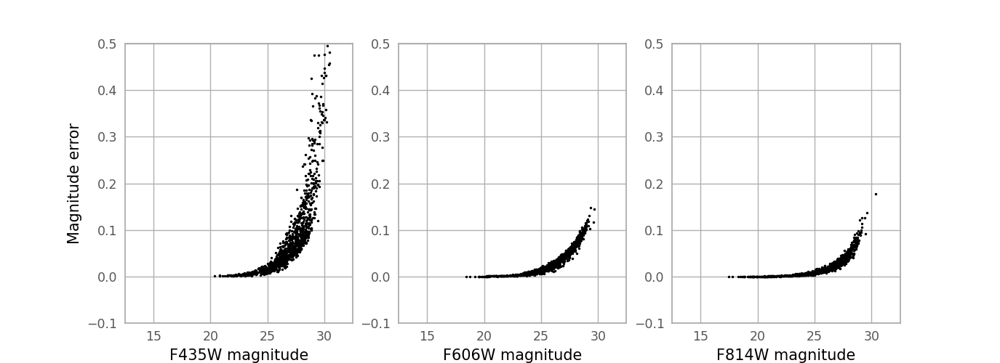

In [17]:
xlab = ["F435W magnitude", "F606W magnitude", "F814W magnitude"]
ylab = ["Magnitude error"]

fig, axs = plt.subplots(1, 3, figsize=(11,4))
axs[0].set_ylabel(ylab[0])
for i, ax in enumerate(axs):
    mag_range = (dat[i]['mag'] < 99.0)
    # magnitude of 99.0 means the source not detected in the 606-band image but detected in the 814-band image.
    ax.plot(dat[i]['mag'][mag_range], dat[i]['merr'][mag_range], 'o', ms=1, c='k')
    ax.set_xlim([12.5, 32.5])
    ax.set_ylim([-0.1, 0.5])
    ax.set_xlabel(xlab[i])
    #ax.set_ylabel(ylab[0])

### 2) Magnitude - stellarity (``CLASS_STAR``) digram

<IPython.core.display.Javascript object>


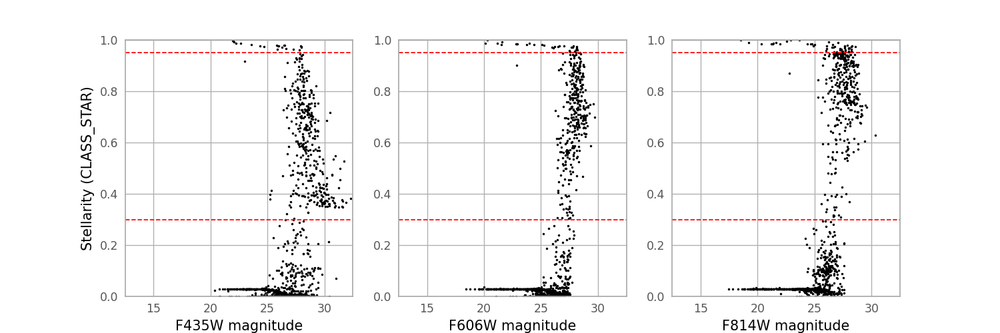

In [18]:
xlab = ["F435W magnitude","F606W magnitude", "F814W magnitude"]
ylab = ["Stellarity (CLASS_STAR)"]

fig, axs = plt.subplots(1, 3, figsize=(12,4))
axs[0].set_ylabel(ylab[0])
for i, ax in enumerate(axs):
    mag_range = (dat[i]['mag'] < 99.0)
    # magnitude of 99.0 means the source not detected in the 606-band image but detected in the 814-band image.
    ax.plot(dat[i]['mag'][mag_range], dat[i]['cl'][mag_range], 'o', ms=1, c='k')
    
    ax.axhline(0.3, 0, 1, color='red', ls='--', lw=1)
    ax.axhline(0.95, 0, 1, color='red', ls='--', lw=1)
    # CLASS_STAR = 0.4 cut can also depend on the image quality, distribution of CLASS_STAR, or your scientific goals!
    ax.set_xlim([12.5, 32.5])
    ax.set_ylim([0.0, 1.0])
    ax.set_xlabel(xlab[i])
    

### From the above basic results, how can you select point/extended sources for analysis?

### 3) CMDs of galaxies (just for example!)

<IPython.core.display.Javascript object>


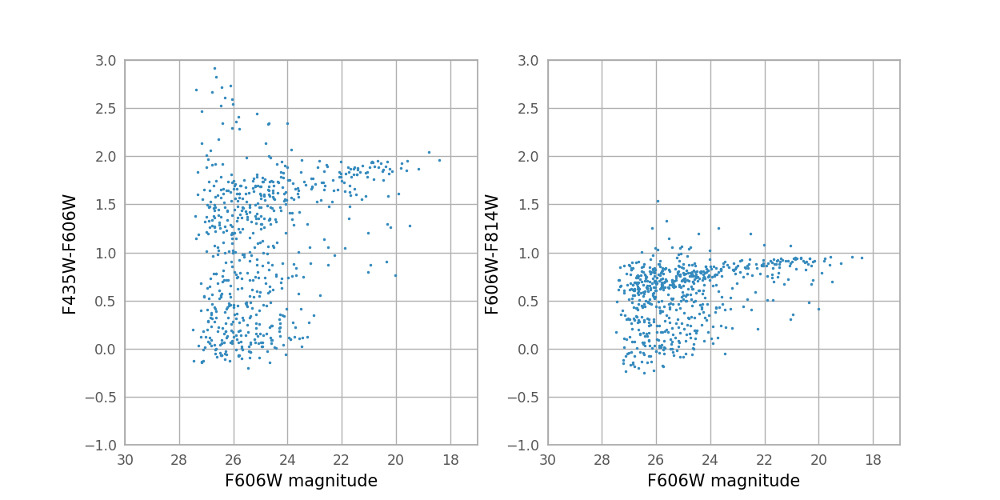

In [19]:
gal_cnd = ((dat_V['mag'] < 30.0) & (dat_V['merr'] < 0.5) & (dat_I['mag'] < 30.0) & (dat_I['merr'] < 0.5) & \
           (dat_V['flxrad'] > 4.) & (dat_V['fwhm'] > 4.) & (dat_I['flxrad'] > 4.) & (dat_I['fwhm'] > 4.) & \
           (dat_V['mag']-dat_I['mag'] > -1.0) & (dat_V['mag']-dat_I['mag'] < 2.0) & \
           (dat_I['cl'] < 0.35))

xlab = ["F435W-F606W","F606W-F814W"]
ylab = ["F606W magnitude"]
fig, axs = plt.subplots(1, 2, figsize=(10,5))
for i, ax in enumerate(axs):
    ax.plot( dat_V['mag'][gal_cnd],dat[i]['mag'][gal_cnd]-dat[i+1]['mag'][gal_cnd], 'o', ms=1)
    ax.set_ylim([-1.0, 3.0])
    ax.set_xlim([30.0, 17.0])
    ax.set_xlabel(ylab[0])
    ax.set_ylabel(xlab[i])

<IPython.core.display.Javascript object>


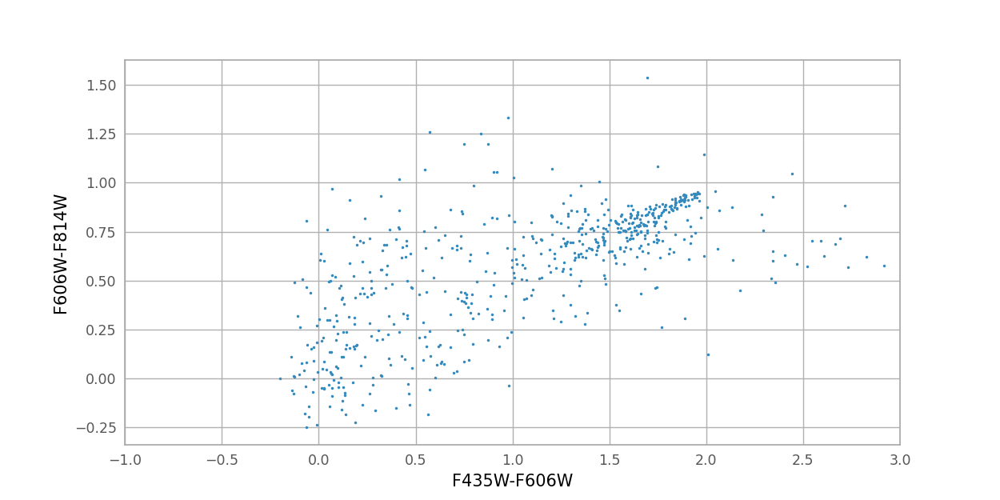

Text(0, 0.5, 'F606W-F814W')

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(10,5))
xlab = ["F435W-F606W","F606W-F814W"]
ylab = ["F606W magnitude"]
ax.plot(dat[0]['mag'][gal_cnd]-dat[1]['mag'][gal_cnd], dat[1]['mag'][gal_cnd]-dat[2]['mag'][gal_cnd], 'o', ms=1)
ax.set_xlim([-1.0, 3.0])
#ax.set_ylim([30.0, 17.0])
ax.set_xlabel(xlab[0])
ax.set_ylabel(xlab[1])

### How about CMDs of point sources? or the sources of ``CLASS_STAR`` = 0.4 - 0.8? Do it yourself :)

In [21]:
from astropy.visualization import astropy_mpl_style
plt.style.use(astropy_mpl_style)
from astropy.visualization import simple_norm

In [22]:
star_cnd = dat_B['cl'] > 0.90

In [23]:
h606dat = fits.getdata(imglist[1])
norm = simple_norm(h606dat, 'log')

<IPython.core.display.Javascript object>


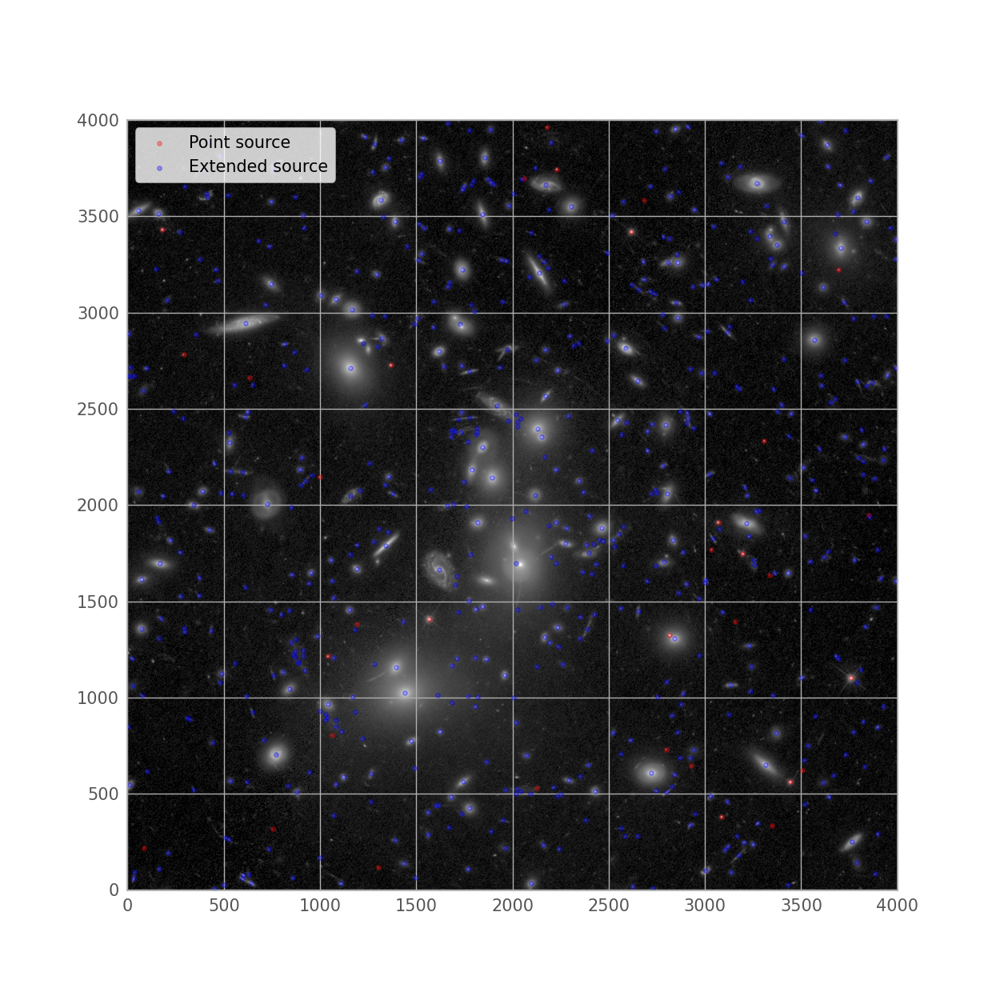

In [24]:
plt.figure(figsize = (10,10))
plt.imshow(h606dat*20, origin = 'lower', norm = norm, cmap = 'gray')
plt.scatter(dat_V[star_cnd]['x']-1,dat_V[star_cnd]['y']-1, marker = '.', c = 'r', alpha = 0.3, label = 'Point source')
plt.scatter(dat_V[gal_cnd]['x']-1,dat_V[gal_cnd]['y']-1, marker = '.', c = 'b', alpha = 0.3, label = 'Extended source')
plt.legend()
plt.show()

##### Derive Photometry of all the visible sources in these images using SExtractor. All the information needed for deriving photometry are provided in the parameter files

In [25]:
colnames = ['x','y','xw','yw','num','mag','merr','kron','backgr','ra','dec',
            'a','b','theta','mu0','flag','fwhm','flxrad','cl','el']
dat_B = np.genfromtxt(cat_name[0], dtype=None, encoding='ascii', names=colnames)
dat_V = np.genfromtxt(cat_name[1], dtype=None, encoding='ascii', names=colnames)
dat_I = np.genfromtxt(cat_name[2], dtype=None, encoding='ascii', names=colnames)
real_sources = ((dat_V['mag'] < 30.0) & (dat_V['merr'] < 0.5) & (dat_V['flag'] < 32) & (dat_V['mag']-dat_I['mag'] > -1.0) & (dat_V['mag']-dat_I['mag'] < 4.0))

<IPython.core.display.Javascript object>


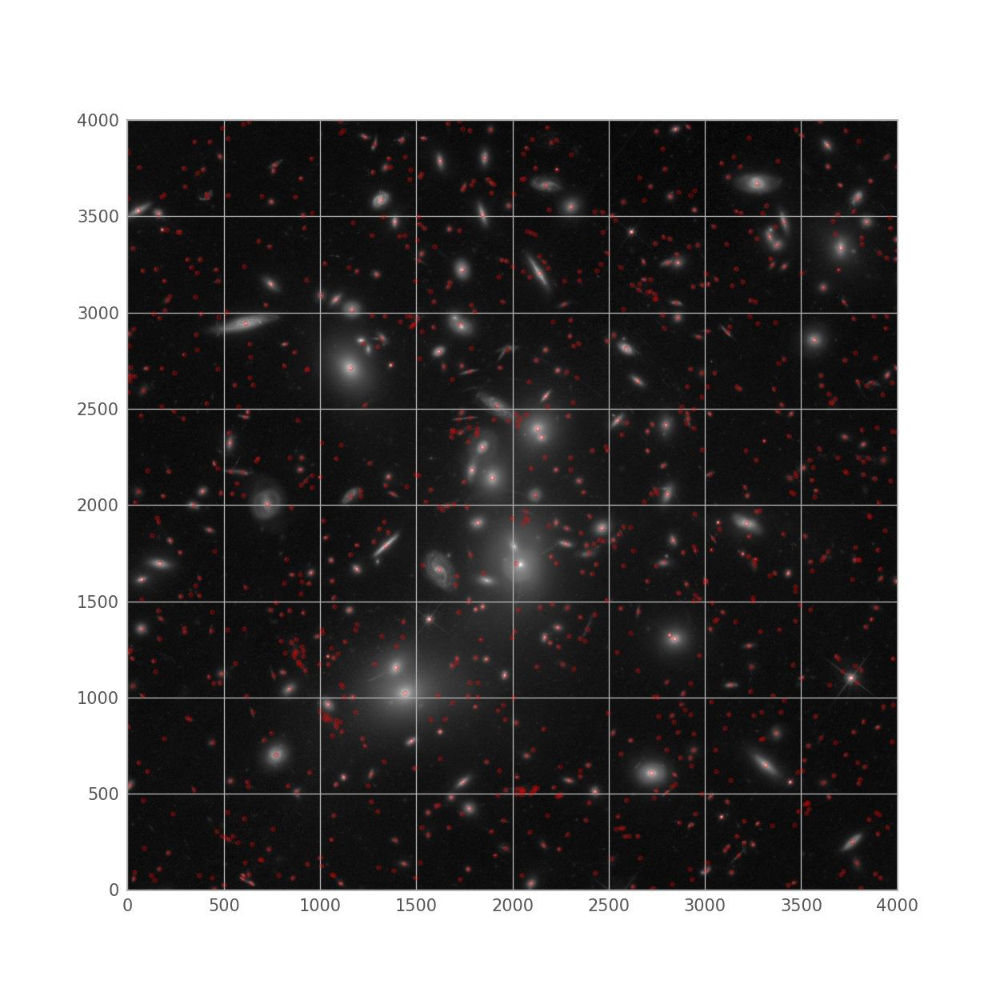

In [26]:
h814dat = fits.getdata(imglist[2])
plt.figure(figsize = (10,10))
plt.imshow(h814dat*10, origin = 'lower', norm = norm, cmap = 'gray')
plt.scatter(dat_B[real_sources]['x']-1,dat_B[real_sources]['y']-1, marker = '.', c = 'r', alpha = 0.2)
plt.show()

##### 'Setllarity' is a very useful parameter to distinguish between point sources and extended sources. Plot manigtude versus stellarity diagrams and select point sources and extended soruces. Then Plot CMDs and CCDs for these point sources and extended sources, and describe what they show. Investigate the properties of these sources.


In [27]:
dat = [dat_B,dat_V,dat_I]

<IPython.core.display.Javascript object>


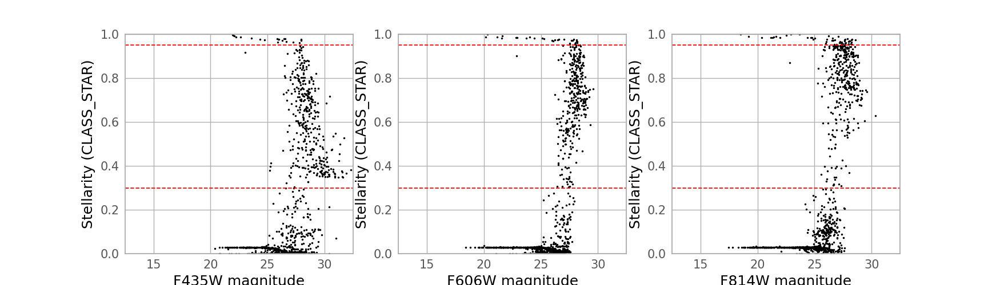

In [28]:
xlab = ["F435W magnitude","F606W magnitude", "F814W magnitude"]
ylab = ["Stellarity (CLASS_STAR)"]

fig, axs = plt.subplots(1, 3, figsize=(14,4))
for i, ax in enumerate(axs):
    mag_range = (dat[i]['mag'] < 99.0)
    # magnitude of 99.0 means the source not detected in the 606-band image but detected in the 814-band image.
    ax.plot(dat[i]['mag'][real_sources], dat[i]['cl'][real_sources], 'o', ms=1, c='k')
    
    ax.axhline(0.3, 0, 1, color='red', ls='--', lw=1)
    ax.axhline(0.95, 0, 1, color='red', ls='--', lw=1)
    # CLASS_STAR = 0.4 cut can also depend on the image quality, distribution of CLASS_STAR, or your scientific goals!
    ax.set_xlim([12.5, 32.5])
    ax.set_ylim([0.0, 1.0])
    ax.set_xlabel(xlab[i])
    ax.set_ylabel(ylab[0])

In [29]:
star_cut = (dat_V['cl'] > 0.90) & (real_sources)
gal_cut = (dat_V['cl'] < 0.30) & (real_sources)

In [30]:
star_V

NameError: name 'star_V' is not defined

<IPython.core.display.Javascript object>


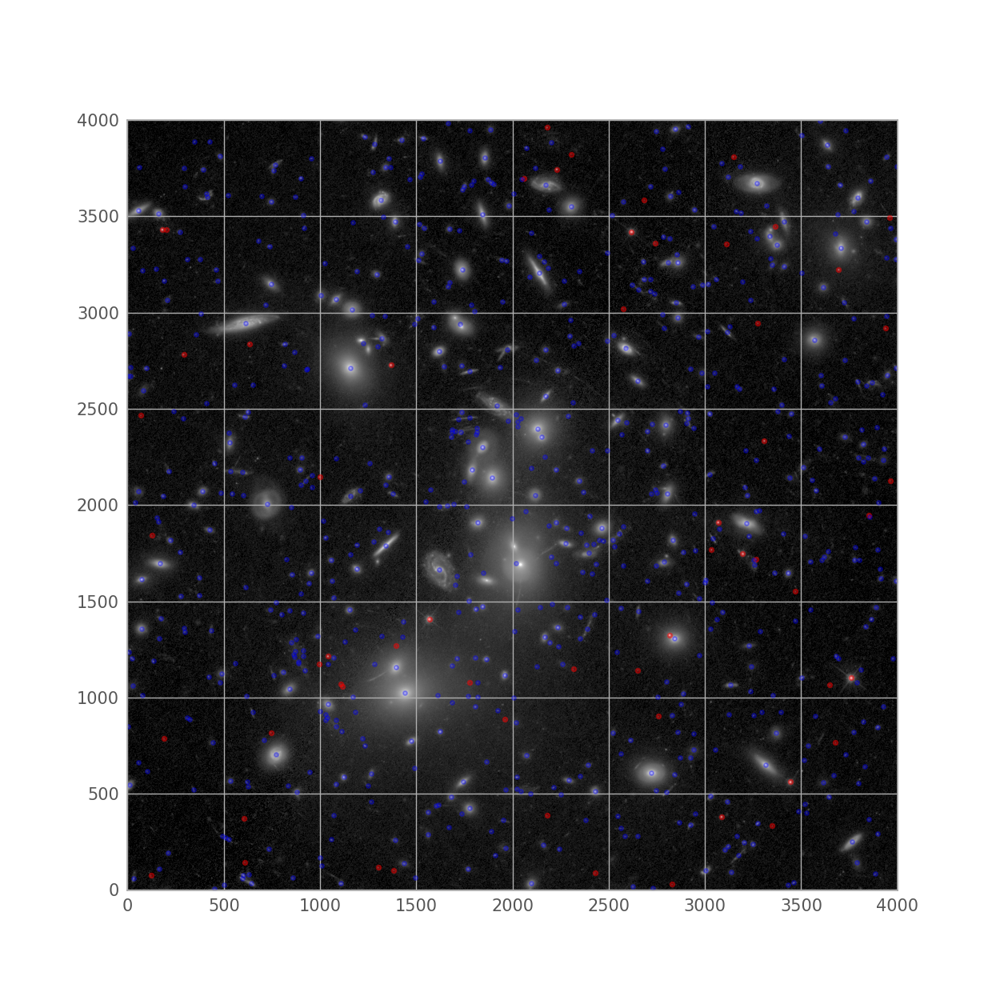

NameError: name 'star_V' is not defined

In [31]:
h606dat = fits.getdata(imglist[1])
plt.figure(figsize = (10,10))
plt.imshow(h606dat*20, origin = 'lower', norm = norm, cmap = 'gray')
plt.scatter(dat_V[star_cut]['x']-1,dat_V[star_cut]['y']-1, s = 45, facecolor = 'none', marker = '.', c = 'r', alpha = 0.4, label = 'Point source')
plt.scatter(dat_V[gal_cut]['x']-1,dat_V[gal_cut]['y']-1, marker = '.', c = 'b',facecolor = 'none', alpha = 0.3, label ='Extended source')
plt.scatter(star_V['x']-1,star_V['y']-1, marker = '.', c = 'y',facecolor = 'none', alpha = 1, label ='Star')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


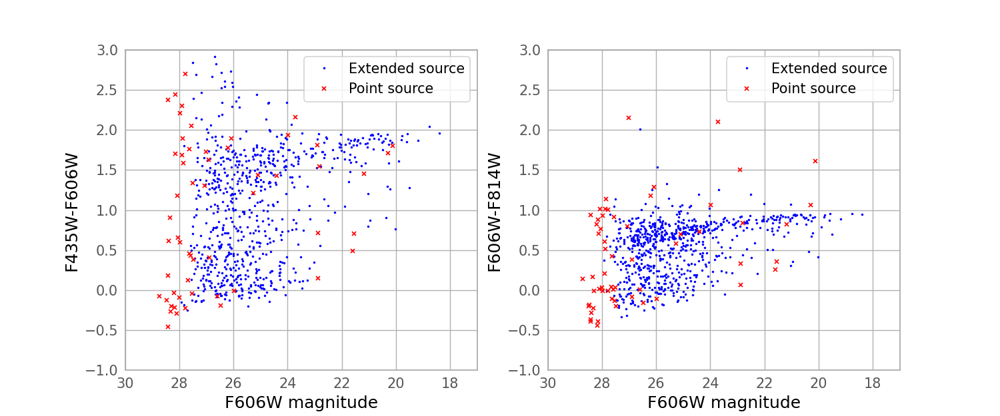

In [32]:
xlab = ["F435W-F606W","F606W-F814W"]
ylab = ["F606W magnitude"]

fig, axs = plt.subplots(1, 2, figsize=(12,5))
for i, ax in enumerate(axs):
    ax.plot( dat_V['mag'][gal_cut],dat[i]['mag'][gal_cut]-dat[i+1]['mag'][gal_cut], 'o', ms=1, c = 'b', label = 'Extended source')
    ax.plot( dat_V['mag'][star_cut],dat[i]['mag'][star_cut]-dat[i+1]['mag'][star_cut], 'x', ms=3, c = 'r', label = 'Point source')
    ax.legend(loc=1)
    ax.set_ylim([-1.0, 3.0])
    ax.set_xlim([30.0, 17.0])
    ax.set_xlabel(ylab[0])
    ax.set_ylabel(xlab[i])


<IPython.core.display.Javascript object>


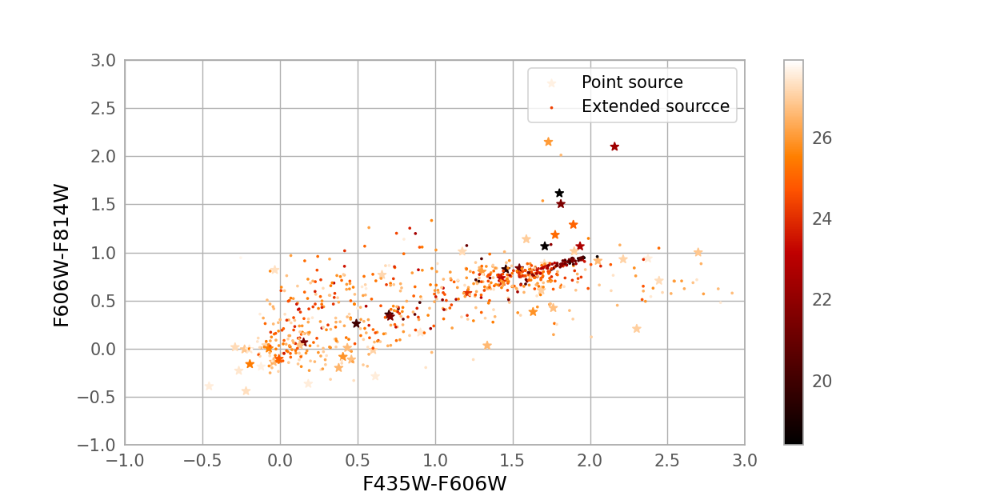

/home/hhchoi1022/anaconda3/envs/hhchoi1022/lib/python3.7/site-packages/ipykernel_launcher.py:9: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  if __name__ == '__main__':


Text(0, 0.5, 'F606W-F814W')

In [33]:
xlab = ["F435W-F606W","F606W-F814W"]
ylab = ["F606W magnitude"]

plt.figure(figsize=(10,5))
plt.scatter( dat_B['mag'][star_cut]-dat_V['mag'][star_cut],dat_V['mag'][star_cut]-dat_I['mag'][star_cut], marker = '*',c = dat_V['mag'][star_cut], label = 'Point source')
plt.scatter( dat_B['mag'][gal_cut]-dat_V['mag'][gal_cut],dat_V['mag'][gal_cut]-dat_I['mag'][gal_cut], s=5, marker = '.', c = dat_V['mag'][gal_cut] , label = 'Extended sourcce')
plt.ylim([-1.0, 3.0])
plt.legend()
plt.colorbar()
plt.xlim([-1.0, 3.0])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

##### Find stars 

In [34]:
from astropy.table import Table

In [35]:
from astropy.io import ascii

In [36]:
reference = ascii.read('catalog.txt')

In [37]:
star_candidate = dat_V[star_cut]
comp = Table()
comp['RA'] = star_candidate['xw']
comp['Dec'] = star_candidate['yw']
comp.write('star.csv', format = 'ascii', overwrite = True)

In [38]:
from astropy.coordinates import SkyCoord

In [39]:
ref_coord = SkyCoord(reference['ra'],reference['dec'], unit = 'deg', frame = 'icrs')

In [40]:
obj_coord = SkyCoord(star_candidate['xw'], star_candidate['yw'], unit = 'deg', frame ='icrs')

In [41]:
idx, d2d, d3d = obj_coord.match_to_catalog_sky(ref_coord)

In [42]:
star_idx = np.where(reference[idx]['otype_txt']=='*')

In [43]:
len(star_idx[0])

10

In [44]:
stars = star_candidate[star_idx]

In [45]:
stars_ref = reference[idx][reference[idx]['otype_txt']=='*']

In [46]:
star_B = dat_B[star_cut][star_idx]

In [47]:
star_V = dat_V[star_cut][star_idx]

In [48]:
star_I = dat_I[star_cut][star_idx]

<IPython.core.display.Javascript object>


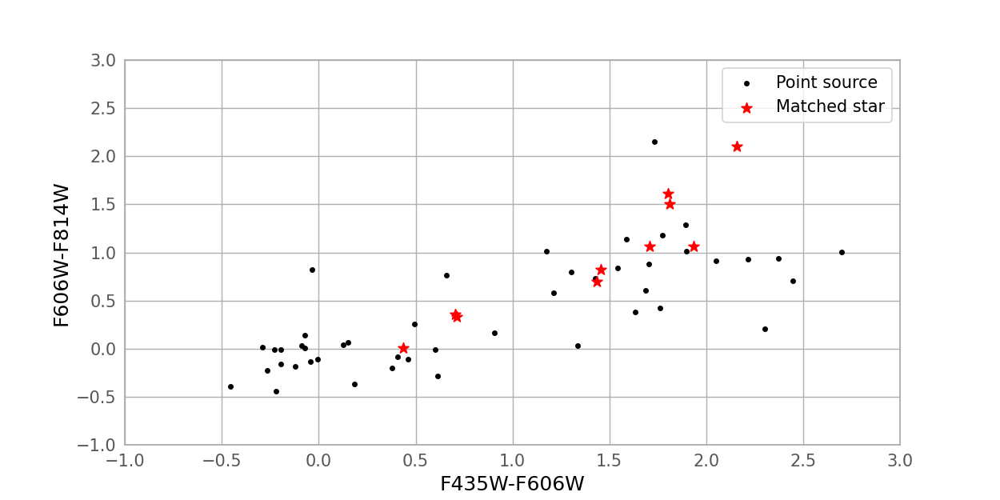

Text(0, 0.5, 'F606W-F814W')

In [65]:
xlab = ["F435W-F606W","F606W-F814W"]
ylab = ["F606W magnitude"]

plt.figure(figsize=(10,5))
plt.scatter( dat_B['mag'][star_cut]-dat_V['mag'][star_cut],dat_V['mag'][star_cut]-dat_I['mag'][star_cut], marker = '.',c = 'k', label = 'Point source')
plt.scatter( dat_B['mag'][star_cut][star_idx]-dat_V['mag'][star_cut][star_idx],dat_V['mag'][star_cut][star_idx]-dat_I['mag'][star_cut][star_idx], marker = '*',s = 60, c = 'r', label = 'Matched star')
plt.ylim([-1.0, 3])
plt.legend()
#clb = plt.colorbar()
#clb.ax.set_title('mag[AB]')
plt.xlim([-1.0, 3])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

In [60]:
starlist = [star_B, star_V, star_I]

<IPython.core.display.Javascript object>


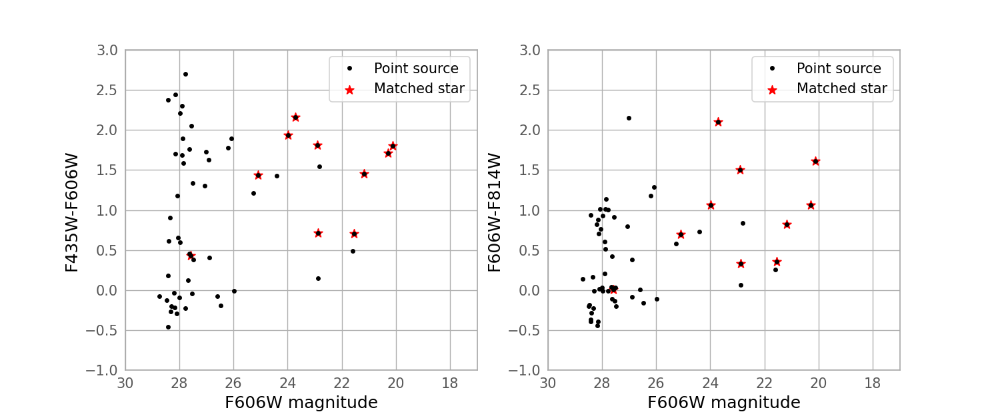

In [54]:
xlab = ["F435W-F606W","F606W-F814W"]
ylab = ["F606W magnitude"]

fig, axs = plt.subplots(1, 2, figsize=(12,5))
for i, ax in enumerate(axs):
    #ax.plot( dat_V['mag'][gal_cut],dat[i]['mag'][gal_cut]-dat[i+1]['mag'][gal_cut], 'o', ms=1, c = 'b', label = 'Extended source')
    ax.plot( dat_V['mag'][star_cut],dat[i]['mag'][star_cut]-dat[i+1]['mag'][star_cut], 'o', ms=3, c = 'k', label = 'Point source')
    ax.plot( star_V['mag'],starlist[i]['mag']-starlist[i+1]['mag'], '*',  ms=10, c = 'r', label = 'Star')
    ax.legend(loc=1)
    ax.set_ylim([-1.0, 3.0])
    ax.set_xlim([30.0, 17.0])
    ax.set_xlabel(ylab[0])
    ax.set_ylabel(xlab[i])


In [106]:
def conversion1(tbl, input_wl, output_wl):
    converted_mag = []
    for i, mag in enumerate(tbl['mag']):
        converted_mag.append(conversion(mag, input_wl, output_wl))
        print( conversion(mag, input_wl, output_wl))
        print(mag - conversion(mag, input_wl, output_wl))
        #print(round(mag,2),round(conversion(mag, 'f814w','Johnson, I'),3),'   ',mag-conversion(mag, 'f814w','Johnson, I'))
    tbl['mag'] = converted_mag

In [107]:
conversion1(star_B, 'f435w', 'Johnson, B')

25.850118097828037
0.026781902171961747
22.218918097828034
0.0267819021719653
21.900918097828036
0.0267819021719653
25.899018097828034
0.0267819021719653
21.966818097828032
0.026781902171968852
26.500718097828035
0.0267819021719653
24.697718097828037
0.026781902171961747
23.560118097828035
0.0267819021719653
22.607318097828035
0.0267819021719653
27.987018097828035
0.0267819021719653


In [108]:
conversion1(star_V, 'f606w', 'Johnson, V')

23.825458826270808
-0.1074588262708076
21.650158826270804
-0.10745882627080405
20.23255882627081
-0.10745882627081116
24.09745882627081
-0.10745882627081116
20.39245882627081
-0.10745882627081116
25.20075882627081
-0.10745882627081116
23.020058826270812
-0.10745882627081116
22.98265882627081
-0.10745882627081116
21.284458826270807
-0.1074588262708076
27.68695882627081
-0.10745882627081116


In [109]:
conversion1(star_I, 'f814w', 'Johnson, I')

21.615508891120744
0.0030911088792571206
21.18390889112074
0.0030911088792606733
18.506108891120743
0.0030911088792571206
22.92220889112074
0.0030911088792606733
19.216708891120742
0.0030911088792571206
24.392908891120744
0.0030911088792571206
21.405308891120743
0.0030911088792571206
22.53740889112074
0.0030911088792606733
20.347708891120742
0.0030911088792571206
27.56690889112074
0.0030911088792606733


In [82]:
# Galactic extinction 
#https://irsa.ipac.caltech.edu/workspace/TMP_cGjnT6_32650/DUST/3.5740120887_-30.394808797.v0001/extinction.html
star_B['mag'] -= 0.048
star_V['mag'] -= 0.036
star_I['mag'] -= 0.020

<IPython.core.display.Javascript object>


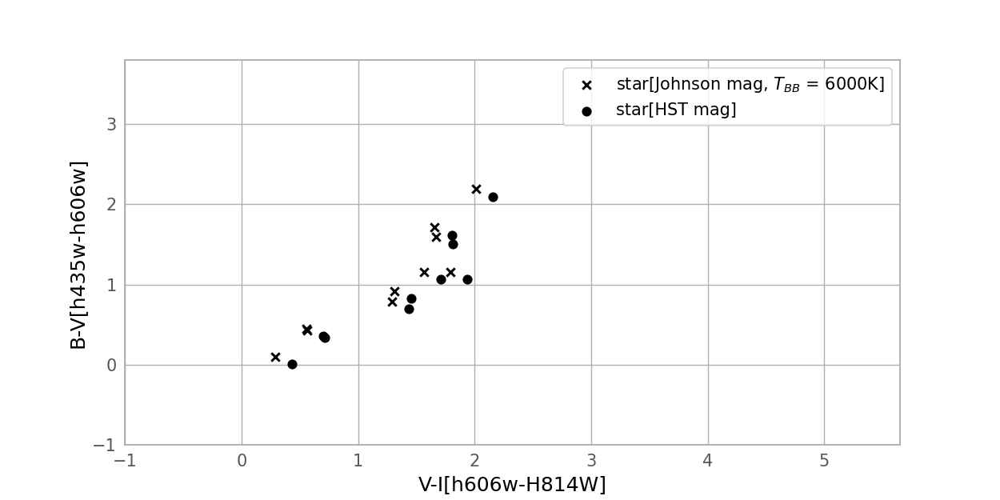

Text(0, 0.5, 'B-V[h435w-h606w]')

In [85]:
xlab = ["V-I[h606w-H814W]","B-V[h435w-h606w]"]
plt.figure(figsize=(10,5))
plt.scatter(star_B['mag']-star_V['mag'],star_V['mag']-star_I['mag'], marker = 'x', label = r'star[Johnson mag, $T_{BB}$ = 6000K]', c= 'k')
plt.scatter(dat_B['mag'][star_cut][star_idx]-dat_V['mag'][star_cut][star_idx],dat_V['mag'][star_cut][star_idx]-dat_I['mag'][star_cut][star_idx], marker = 'o', label = 'star[HST mag]', c='k')
plt.ylim([-1.0, 3.8])
plt.legend()
plt.xlim([-1.0, 5.65])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

<IPython.core.display.Javascript object>


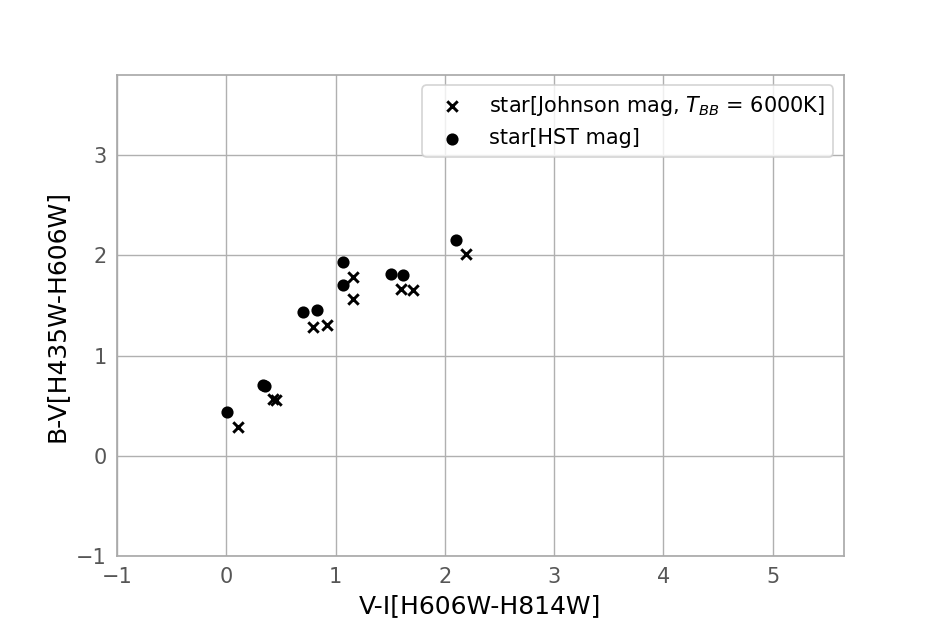

In [88]:
xlab = ["V-I[H606W-H814W]","B-V[H435W-H606W]"]
plt.figure(figsize=(7.5,5))
plt.scatter(star_V['mag']-star_I['mag'],star_B['mag']-star_V['mag'], marker = 'x', label = r'star[Johnson mag, $T_{BB}$ = 6000K]', c= 'k')
plt.scatter(dat_V['mag'][star_cut][star_idx]-dat_I['mag'][star_cut][star_idx],dat_B['mag'][star_cut][star_idx]-dat_V['mag'][star_cut][star_idx], marker = 'o', label = 'star[HST mag]', c='k')
plt.ylim([-1.0, 3.8])
plt.legend()
plt.xlim([-1.0, 5.65])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])
plt.savefig('aaa.png',transparent = True)

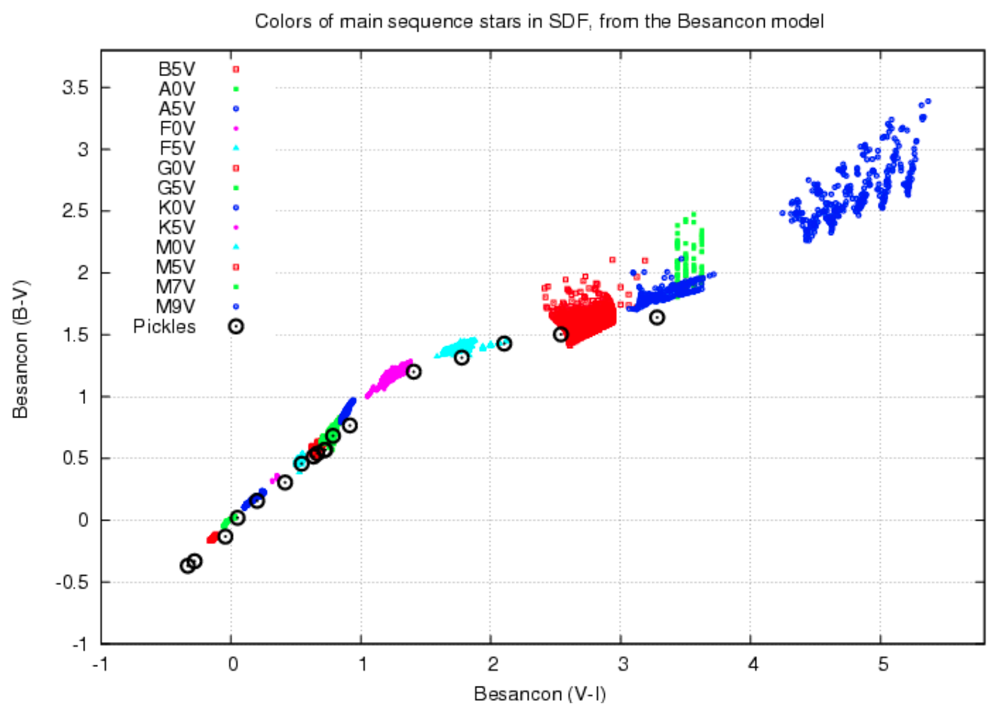

##### Find galaxies

In [90]:
star_num = dat_V[star_cut][star_idx]['num']

In [91]:
nostar_cut= []
for i in range(len(dat_V)):
    if dat_V['num'][i] not in star_num:
        nostar_cut.append(i)

In [92]:
gal_idx = ((dat_V[gal_cut]['mag'] < 30.0) & (dat_V[gal_cut]['merr'] < 0.5) & (dat_I[gal_cut]['mag'] < 30.0) & (dat_I[gal_cut]['merr'] < 0.5) & (dat_V[gal_cut]['cl'] < 0.35))

In [93]:
gal_circular_idx = ((dat_V[nostar_cut]['mag'] < 30.0) & (dat_V[nostar_cut]['merr'] < 0.5) & (dat_I[nostar_cut]['mag'] < 30.0) & (dat_I[nostar_cut]['merr'] < 0.5) & (dat_V[nostar_cut]['cl'] > 0.95))

In [94]:
galaxy_B = dat_B[gal_cut][gal_idx]

In [95]:
galaxy_V = dat_V[gal_cut][gal_idx]

In [96]:
galaxy_I = dat_I[gal_cut][gal_idx]

In [97]:
cgalaxy_B = dat_B[nostar_cut][gal_circular_idx]

In [98]:
cgalaxy_V = dat_V[nostar_cut][gal_circular_idx]

In [99]:
cgalaxy_I = dat_I[nostar_cut][gal_circular_idx]

<IPython.core.display.Javascript object>


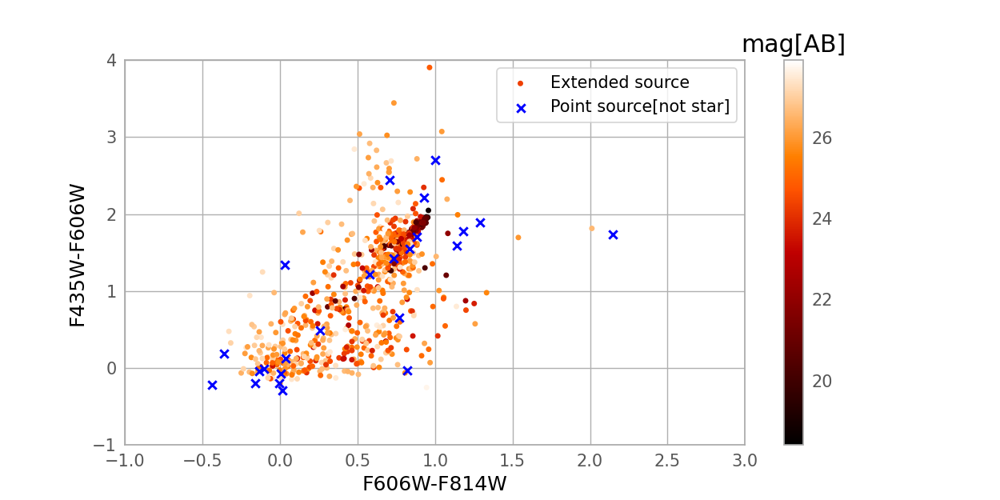

/home/hhchoi1022/anaconda3/envs/hhchoi1022/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  


Text(0, 0.5, 'F435W-F606W')

In [101]:
xlab = ["F606W-F814W","F435W-F606W"]
ylab = ["F606W magnitude"]

plt.figure(figsize=(10,5))
plt.scatter( galaxy_V['mag']-galaxy_I['mag'],galaxy_B['mag']-galaxy_V['mag'], marker = '.',c = galaxy_V['mag'], label = 'Extended source')
clb = plt.colorbar()
clb.ax.set_title('mag[AB]')
plt.scatter( cgalaxy_V['mag']-cgalaxy_I['mag'],cgalaxy_B['mag']-cgalaxy_V['mag'], marker = 'x',c = 'b', label = 'Point source[not star]')
plt.ylim([-1, 4])
plt.legend()

plt.xlim([-1.0, 3])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

<IPython.core.display.Javascript object>


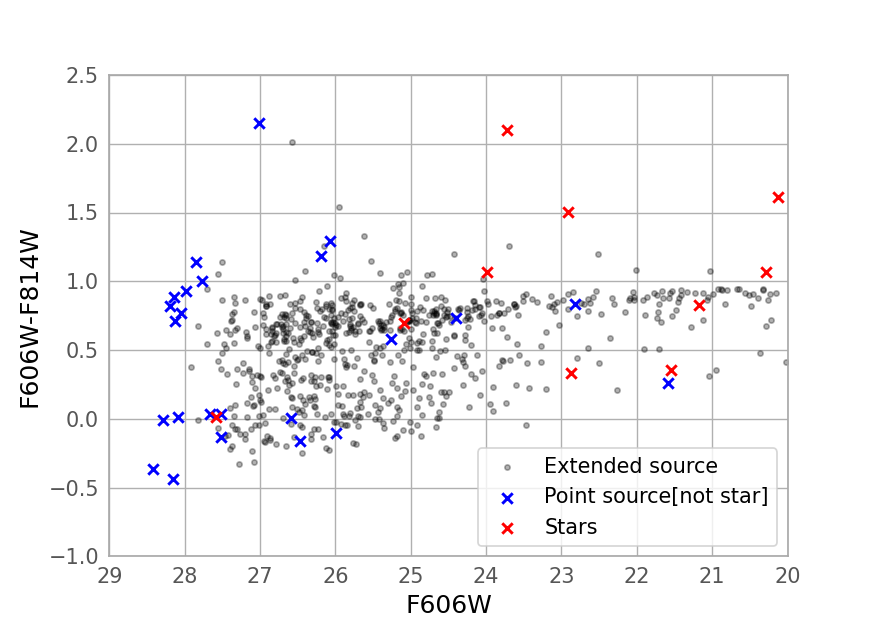

Text(0, 0.5, 'F606W-F814W')

In [141]:
xlab = ["F606W","F606W-F814W"]

plt.figure(figsize=(7,5))
plt.scatter( galaxy_V['mag'],galaxy_V['mag']-galaxy_I['mag'], marker = '.',c = 'k', label = 'Extended source',alpha = 0.3)
plt.scatter( cgalaxy_V['mag'],cgalaxy_V['mag']-cgalaxy_I['mag'], marker = 'x',c = 'b', label = 'Point source[not star]')
plt.scatter( star_V['mag'],star_V['mag']-star_I['mag'], marker = 'x',c = 'r', label = 'Stars')
plt.ylim([-1, 2.5])
plt.legend()
plt.xlim([29.0, 20])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

<IPython.core.display.Javascript object>


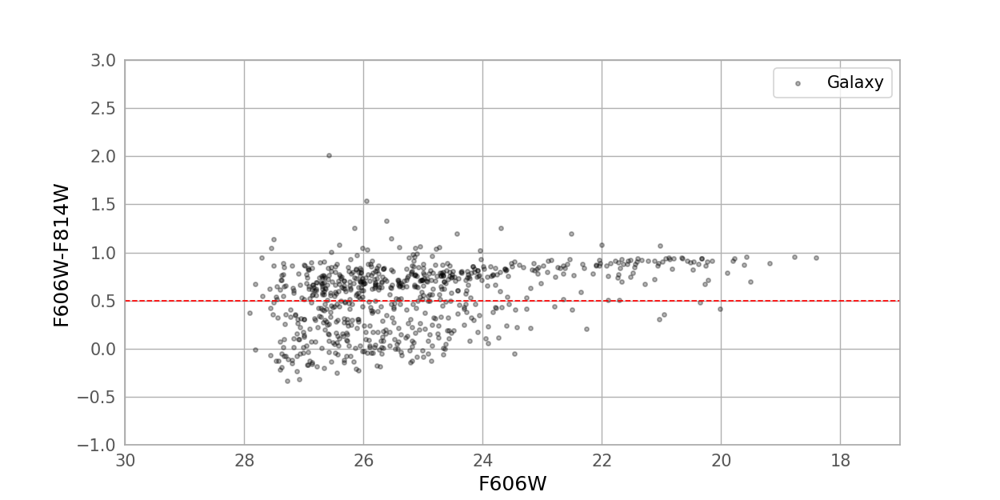

Text(0, 0.5, 'F606W-F814W')

In [144]:
xlab = ["F606W","F606W-F814W"]

plt.figure(figsize=(10,5))
plt.scatter( galaxy_V['mag'],galaxy_V['mag']-galaxy_I['mag'], marker = '.',c = 'k', label = 'Galaxy',alpha = 0.3)
plt.axhline(0.5, linestyle = '--', color ='r', linewidth = 1)
plt.ylim([-1, 3])
plt.legend()
plt.xlim([30.0, 17])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

In [145]:
cut = galaxy_V['mag']-galaxy_I['mag'] > 0.5

In [146]:
red_B = galaxy_B[cut]
red_V = galaxy_V[cut]
red_I = galaxy_I[cut]

In [147]:
blue_B = galaxy_B[~cut]
blue_V = galaxy_V[~cut]
blue_I = galaxy_I[~cut]

<IPython.core.display.Javascript object>


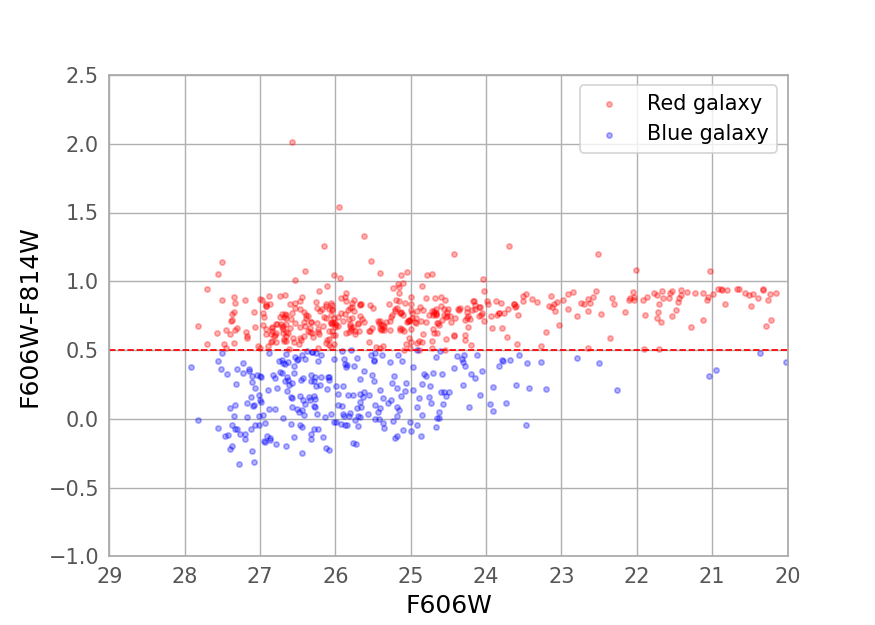

Text(0, 0.5, 'F606W-F814W')

In [150]:
xlab = ["F606W","F606W-F814W"]

plt.figure(figsize=(7,5))
plt.scatter( red_V['mag'],red_V['mag']-red_I['mag'], marker = '.',c = 'r', label = 'Red galaxy',alpha = 0.3)
plt.scatter( blue_V['mag'],blue_V['mag']-blue_I['mag'], marker = '.',c = 'b', label = 'Blue galaxy',alpha = 0.3)
plt.axhline(0.5, linestyle = '--', color ='r', linewidth = 1)
plt.ylim([-1, 2.5])
plt.legend()
plt.xlim([29.0, 20])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

In [170]:
rx = np.median(red_V['mag']-red_I['mag'])
bx = np.median(blue_V['mag']-blue_I['mag'])
ry = np.median(red_V['el'])
by = np.median(blue_V['el'])
rstd = np.std(red_V['mag']-red_I['mag'])
bstd = np.std(blue_V['mag']-blue_I['mag'])

<IPython.core.display.Javascript object>


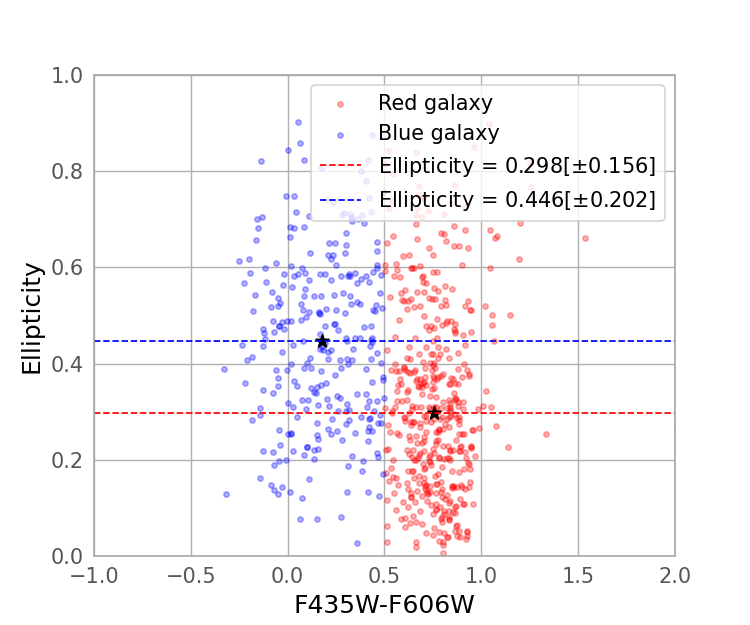

Text(0, 0.5, 'Ellipticity')

In [173]:
xlab = ["F435W-F606W","Ellipticity"]

plt.figure(figsize=(6,5))
plt.scatter( red_V['mag']-red_I['mag'], red_V['el'],marker = '.',c = 'r', label = 'Red galaxy',alpha = 0.3)
plt.scatter( blue_V['mag']-blue_I['mag'], blue_V['el'],marker = '.',c = 'b', label = 'Blue galaxy',alpha = 0.3)
plt.scatter(rx, ry, c= 'k', marker = '*', s =60)
plt.scatter(bx, by, c= 'k', marker = '*', s =60)
plt.axhline(ry, linestyle = '--', color ='r', linewidth = 1, label = fr'Ellipticity = {round(ry,3)}[$\pm${round(rstd,3)}]')
plt.axhline(by, linestyle = '--', color ='b', linewidth = 1, label = fr'Ellipticity = {round(by,3)}[$\pm${round(bstd,3)}]')
plt.xlim([-1, 2])
plt.legend()
plt.ylim([0,1])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

##### Find any erxtreme objects 

<IPython.core.display.Javascript object>


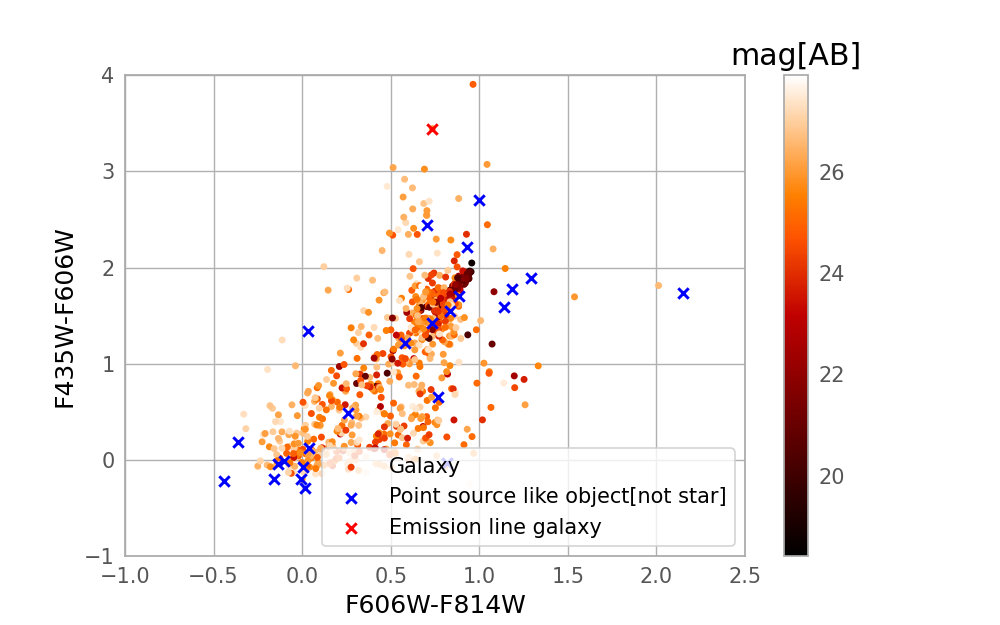

/home/hhchoi1022/anaconda3/envs/hhchoi1022/lib/python3.7/site-packages/ipykernel_launcher.py:6: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  


Text(0, 0.5, 'F435W-F606W')

In [268]:
xlab = ["F606W-F814W","F435W-F606W"]
ylab = ["F606W magnitude"]

plt.figure(figsize=(8,5))
plt.scatter( galaxy_V['mag']-galaxy_I['mag'],galaxy_B['mag']-galaxy_V['mag'], marker = '.',c = galaxy_V['mag'], label = 'Galaxy')
clb = plt.colorbar()
clb.ax.set_title('mag[AB]')
plt.scatter( cgalaxy_V['mag']-cgalaxy_I['mag'],cgalaxy_B['mag']-cgalaxy_V['mag'], marker = 'x',c = 'b', label = 'Point source like object[not star]')
plt.scatter( galaxy_V['mag'][185]-galaxy_I['mag'][185],galaxy_B['mag'][185]-galaxy_V['mag'][185], marker = 'x',c = 'r', label = 'Emission line galaxy')
plt.ylim([-1, 4])
plt.legend(loc = 4)
plt.xlim([-1.0, 2.5])
plt.xlabel(xlab[0])
plt.ylabel(xlab[1])

In [284]:
viredgal = (galaxy_V['mag']-galaxy_I['mag'] > 1.5) 
bvredgal = (galaxy_B['mag']-galaxy_V['mag'] > 3) & (galaxy_B['mag']-galaxy_V['mag'] < 4 )
cviredgal = (cgalaxy_V['mag']-cgalaxy_I['mag'] > 1.5) 
cbvredgal = (cgalaxy_B['mag']-cgalaxy_V['mag'] > 3) & (cgalaxy_B['mag']-cgalaxy_V['mag'] < 4 )

In [285]:
galaxy_vired = galaxy_V[viredgal]
galaxy_bvred = galaxy_V[bvredgal]
cgalaxy_vired = cgalaxy_V[cviredgal]
cgalaxy_bvred = cgalaxy_V[cbvredgal]

In [286]:
bvred = pd.DataFrame(galaxy_bvred)
vired = pd.DataFrame(galaxy_vired)
cbvred = pd.DataFrame(cgalaxy_bvred)
cvired = pd.DataFrame(cgalaxy_vired)

In [287]:
tbl1 = Table()
tbl1 = tbl1.from_pandas(bvred)
ctbl1 = Table()
ctbl1 = ctbl1.from_pandas(cbvred)

In [288]:
tbl2 = Table()
tbl2 = tbl2.from_pandas(vired)
ctbl2 = Table()
ctbl2 = ctbl2.from_pandas(cvired)

In [289]:
from astropy.table import vstack
from astropy.coordinates import SkyCoord

In [290]:
red_galaxies = vstack([tbl1,tbl2])
cred_galaxies = vstack([ctbl1,ctbl2])

In [291]:
bluegal = (galaxy_V['mag']-galaxy_I['mag'] < 0) & (galaxy_B['mag']-galaxy_V['mag'] < 0)
blue_galaxies = Table()
blue_galaxies = blue_galaxies.from_pandas(pd.DataFrame(galaxy_V[bluegal]))
cbluegal = (cgalaxy_V['mag']-cgalaxy_I['mag'] < 0) & (cgalaxy_B['mag']-cgalaxy_V['mag'] < 0)
cblue_galaxies = Table()
cblue_galaxies = cblue_galaxies.from_pandas(pd.DataFrame(cgalaxy_V[cbluegal]))

<IPython.core.display.Javascript object>


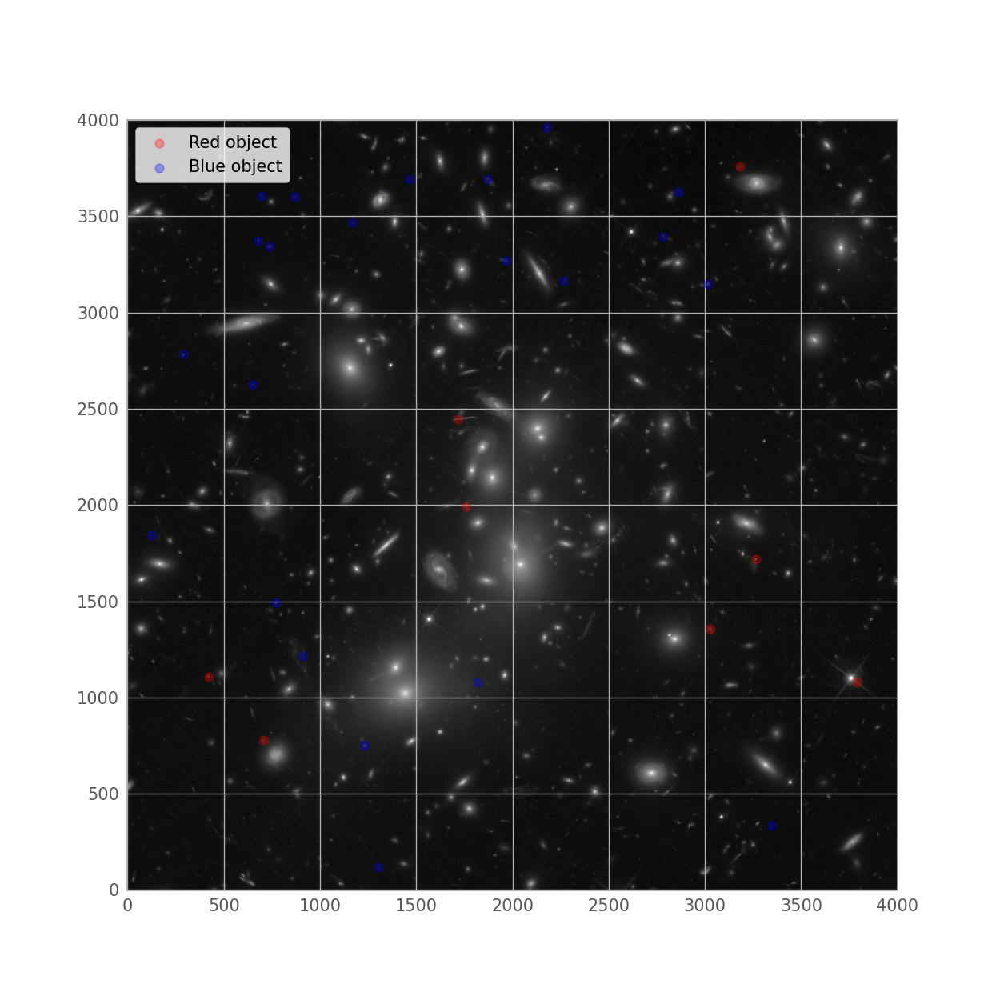

In [292]:
h814dat = fits.getdata(imglist[2])
plt.figure(figsize = (10,10))
plt.imshow(h814dat*10, origin = 'lower', norm = norm, cmap = 'gray')
plt.scatter(red_galaxies['x']-1,red_galaxies['y']-1, marker = 'o', c = 'r', alpha = 0.3, label ='Red object')
plt.scatter(cred_galaxies['x']-1,cred_galaxies['y']-1, marker = 'o', c = 'r', alpha = 0.3)
plt.scatter(blue_galaxies['x']-1,blue_galaxies['y']-1, marker = 'o', c = 'b', alpha = 0.3, label ='Blue object')
plt.scatter(cblue_galaxies['x']-1,cblue_galaxies['y']-1, marker = 'o', c = 'b', alpha = 0.3)
plt.legend(loc = 2)
plt.show()

In [293]:
print(np.mean(blue_galaxies['redshift']))

KeyError: 'redshift'

In [ ]:
print(np.mean(red_galaxies['redshift']))

In [ ]:
blue_galaxies

In [ ]:
emissiongal = red_galaxies[1]

## cblue_galaxies

In [296]:
reference = ascii.read('catalog.txt')
ref_coord = SkyCoord(reference['ra'],reference['dec'], unit = 'deg', frame = 'icrs')
obj_coord = SkyCoord(red_galaxies['xw'], red_galaxies['yw'], unit = 'deg', frame ='icrs')
idx, d2d, d3d = obj_coord.match_to_catalog_sky(ref_coord)
red_galaxies['redshift'] = reference[idx]['rvz_redshift']
#obj_coord = SkyCoord(blue_galaxies['xw'], blue_galaxies['yw'], unit = 'deg', frame ='icrs')
#idx, d2d, d3d = obj_coord.match_to_catalog_sky(ref_coord)
#blue_galaxies['redshift'] = reference[idx]['rvz_redshift']

In [298]:
reference[idx]

otype_txt,rvz_redshift,rvz_type,oid,ra,dec,Main identifier,BiblioReference,NbReferences,Parallax,Radial velocity,galdim_majaxis,galdim_minaxis,Galaxy ellipse angle
str3,float64,str1,int64,float64,float64,str34,str19,int64,float64,float64,int64,int64,int64
G,0.32,z,11981063,3.598509,-30.408403,[MAC2016] A2744cl 337,2016A&A...590A..30M,3,--,81157.35152392066,--,--,--
G,0.49,z,11981452,3.601642,-30.405294,[MAC2016] A2744cl 773,2016A&A...590A..30M,3,--,113591.74497866524,--,--,--
G,0.38,z,11981935,3.589903,-30.397614,[MAC2016] A2744cl 1310,2016A&A...590A..30M,3,--,93352.25830298853,--,--,--
LeG,3.98,z,9785987,3.589375,-30.393874999999998,[IKO2015] 5.1,2014MNRAS.444..268R,7,--,276553.0928738779,--,--,--
G,0.33,z,11982721,3.575214,-30.382946,[MAC2016] A2744cl 2176,2016A&A...590A..30M,3,--,83249.81796243995,--,--,--
*,--,--,11981324,3.5696195686999994,-30.40502762815,[MAC2016] A2744cl 630,2020yCat.1350....0G,3,1.4027,--,--,--,--
G,0.687,z,11981473,3.576741,-30.402969,[MAC2016] A2744cl 796,2016A&A...590A..30M,2,--,143892.88730663247,--,--,--


##### Supernova

In [216]:
SN = cgalaxy_V[10]

<IPython.core.display.Javascript object>


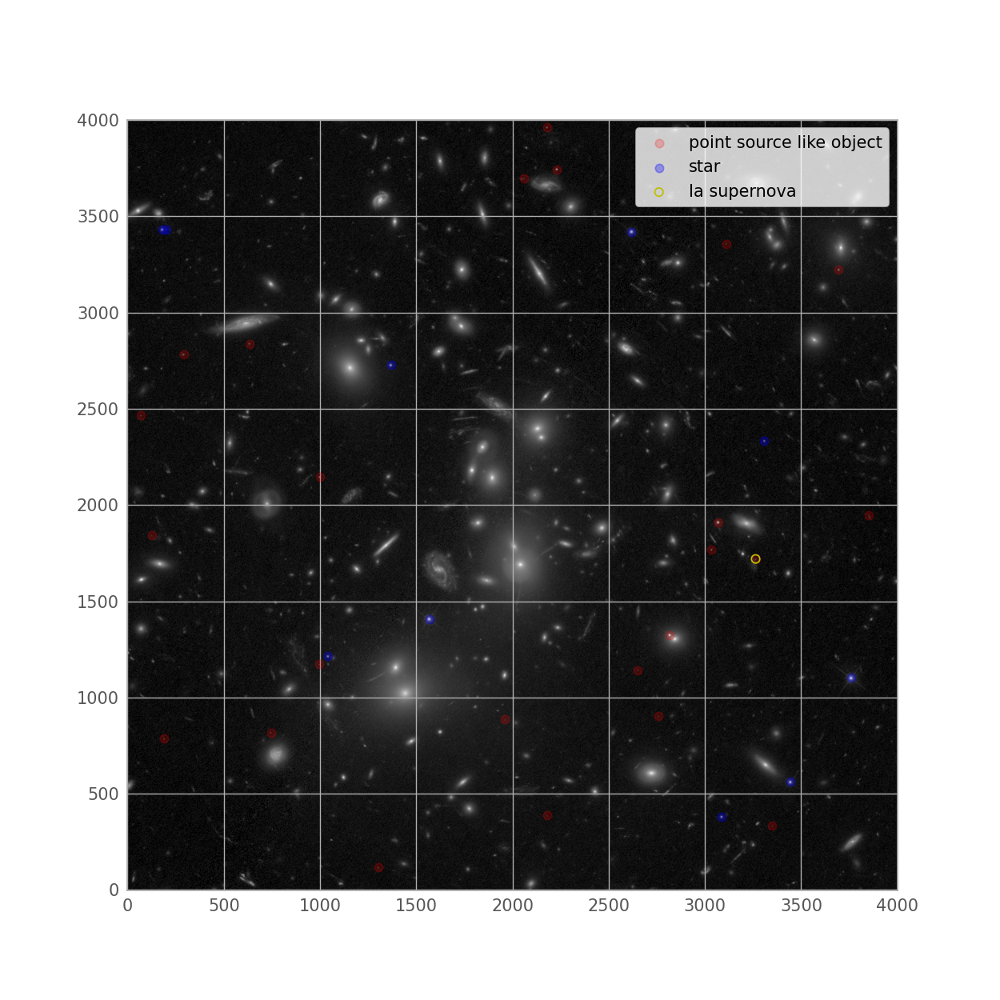

In [217]:
h606dat = fits.getdata(imglist[1])
plt.figure(figsize = (10,10))
plt.imshow(h606dat*10, origin = 'lower', norm = norm, cmap = 'gray')
plt.scatter(cgalaxy_V['x']-1,cgalaxy_V['y']-1,  marker = 'o', c = 'r', alpha = 0.2, label ='point source like object')
plt.scatter(star_V['x']-1,star_V['y']-1, marker = 'o', c = 'b', alpha = 0.3, label ='star')
plt.scatter(SN['x']-1,SN['y']-1,  marker = 'o', facecolor = 'none', edgecolor = 'y',  alpha = 1, label ='Ia supernova')
plt.legend()
plt.show()

/home/hhchoi1022/anaconda3/envs/hhchoi1022/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


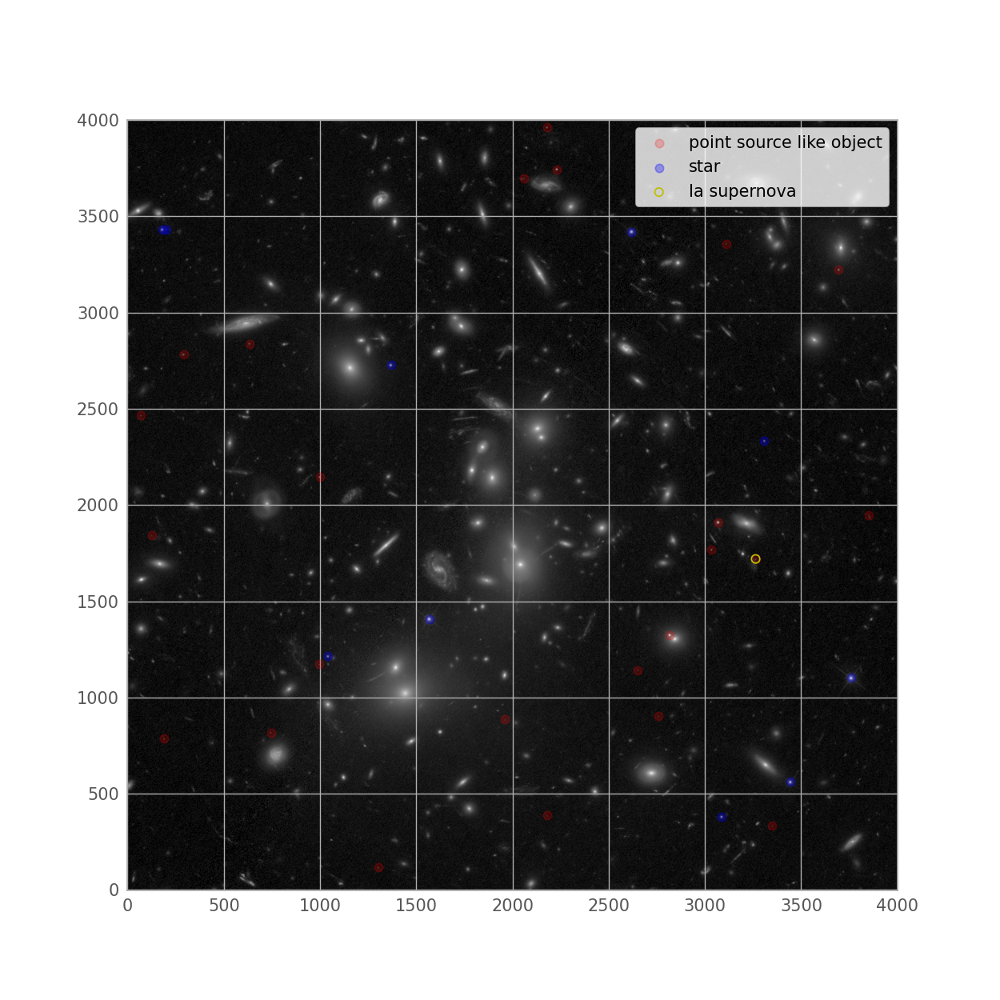

In [294]:
h606dat = fits.getdata(imglist[1])
plt.figure(figsize = (10,10))
plt.imshow(h606dat*10, origin = 'lower', norm = norm, cmap = 'gray')
plt.scatter(cgalaxy_V['x']-1,cgalaxy_V['y']-1,  marker = 'o', c = 'r', alpha = 0.2, label ='point source like object')
plt.scatter(star_V['x']-1,star_V['y']-1, marker = 'o', c = 'b', alpha = 0.3, label ='star')
plt.scatter(SN['x']-1,SN['y']-1,  marker = 'o', facecolor = 'none', edgecolor = 'y',  alpha = 1, label ='Ia supernova')
plt.legend()
plt.show()

In [295]:
# Very faint & extended source? (small galaxies, what about their color?)

## Conversion

In [77]:
def conversion(mag, wave_in, wave_out):
    import os
    import numpy as np
    import matplotlib.pyplot as plt

    import synphot as syn
    from synphot import SourceSpectrum, Observation
    from synphot.models import BlackBody1D, PowerLawFlux1D
    from synphot.units import convert_flux

    from astropy import units as u
    from synphot import units as su

    os.environ['PYSYN_CDBS'] = '/home/hhchoi1022/Desktop/Gitrepo/config/grp/redcat/trds'
    import stsynphot as stsyn
    from stsynphot import band

    val_in   = mag
    unit_in  = u.ABmag
    wl_bp_in = f'acs, wfc1, {wave_in}'
    wl_unit  = u.nm

    # Output: Johnson V mag (AB)

    unit_out  = u.ABmag
    wl_bp_out = wave_out

    quant_in = val_in * unit_in

    mag_systems  = [u.STmag, u.ABmag, su.VEGAMAG]
    flux_systems = ['spectral flux density', 'spectral flux density wav', 
                    'photon flux density', 'photon flux density wav']

    if unit_in in mag_systems:

        mag_in = quant_in

        band_in = band(wl_bp_in)
        wl_in   = band_in.pivot().to(wl_unit)

        flux_in = convert_flux(wl_in, quant_in, su.PHOTLAM)

        plot_unit = su.PHOTLAM

        plot_flux_in = convert_flux(wl_in, flux_in, plot_unit)

    elif unit_in.physical_type in flux_systems:

        flux_in = quant_in
        wl_in   = wl_bp_in * wl_unit 

        plot_unit = unit_in
        plot_flux_in = convert_flux(wl_in, flux_in, plot_unit)

    else:
        print('unit_in not a flux density unit or magnitude system')

    # Spectrum: Flat power law in F_lambda

    pl_index = 0

    #model = PowerLawFlux1D(amplitude=convert_flux(606 * u.nm, 1., su.FLAM), x_0=606 * u.nm, alpha=pl_index)
    #model = PowerLawFlux1D(amplitude=flux_in, x_0=wl_in, alpha=pl_index)
    model = BlackBody1D(6000*u.K)
    spec = SourceSpectrum(model)

    if unit_out in mag_systems:

        band_out = band(wl_bp_out)
        wl_out = band_out.pivot().to(wl_unit)

    elif unit_out.physical_type in flux_systems:

        wl_out = wl_bp_out * wl_unit

    else:
        print('unit_out not a flux density unit or magnitude system') 

    scale = convert_flux(wl_in, flux_in, su.PHOTLAM) / spec(wl_in)

    scale_spec = spec * scale

    if unit_out in mag_systems:

        flux_out = convert_flux(wl_out, scale_spec(wl_out), unit_out)

        plot_flux_out = convert_flux(wl_out, scale_spec(wl_out), plot_unit)

    else:
        flux_out = convert_flux(wl_out, scale_spec(wl_out), unit_out)

        plot_flux_out = convert_flux(wl_out, scale_spec(wl_out), plot_unit)

    val_out = flux_out.value

    #print('Input: {:.4} {} at {:.1f} {}\n'.format(float(val_in), str(unit_in), wl_in.value, str(wl_in.unit)))
    #print('Output: {:.4} {} at {:.1f} {}'.format(float(val_out), str(unit_out), wl_out.value, str(wl_out.unit)))
    return val_out


In [ ]:
wl_settings = [wl.value for wl in [wl_in, wl_out]]

short = min(wl_settings)
long = max(wl_settings)

if short == long:  # In case wl_in == wl_out
    diff = 10.
    
else:
    diff = long - short

right = long + diff

left = max([short - diff, 0.1])

waves = np.linspace(left, right, 10000) * wl_unit

In [ ]:
if wl_in.value > wl_out.value:
        
    c_in = 'r'
    c_out = 'b'
    
else: 
    c_in = 'b'
    c_out = 'r'

In [ ]:
plt.figure()

# Plot spectrum

plt.plot(waves, scale_spec(waves, flux_unit=plot_unit), c='k')

# Plot input

plt.plot(wl_in.value, plot_flux_in.value,
         marker='o', color=c_in, ls='none', 
         label='Input: {:.4} {} at {:.1f} {}'.format(
              float(val_in), str(unit_in), wl_in.value, str(wl_in.unit)))

# Plot output

plt.plot(wl_out.value, plot_flux_out.value,
         marker='s', color=c_out, ls='none', 
         label='Output: {:.4} {} at {:.1f} {}'.format(
              float(val_out), str(unit_out), wl_out.value, str(wl_out.unit)))

# Set heights for dotted lines to markers as % of plot range

bottom, top = plt.ylim()
yrange = top - bottom
inheight = (plot_flux_in.value - bottom) / yrange
outheight = (plot_flux_out.value - bottom) / yrange

# Plot dotted lines to markers

plt.axvline(wl_in.to(wl_unit).value, ymax=inheight, ls=':', c=c_in)
plt.axvline(wl_out.to(wl_unit).value, ymax=outheight, ls=':', c=c_out)

# Miscellaneous

plt.ylabel('Flux ({})'.format(str(plot_unit)))
plt.xlabel('Wavelength ({})'.format(str(wl_unit)))
plt.legend(fontsize='small')    
plt.tight_layout()